# Lab01-Image Processing and Analysis

# Bài 1

### 1. Nhập thư viện

In [4]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

### 2. Hàm show ảnh

In [5]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
    #Chuyển ImageData và LabelData sang dạng danh sách (mảng 1 chiều)
    from matplotlib import pyplot as plt
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if(rows == 1 & cols == 1):
        fig = plt.figure(figsize=(20,20))
    else:
        fig = plt.figure(figsize=(cols*8, rows*5))
        
    for i in range(1, cols * rows + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
        #Nếu số kênh màu bé hơn 3 thì hiển thị ảnh thước xám (grayscale image)
        #Ngược lại, hiển thị ảnh màu (color image)
        if(len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
            plt.grid(gridType)
        else:
            plt.imshow(image)
            plt.grid(gridType)
        plt.title(LabelArray[i - 1])
    plt.show()
                
#Gọi hàm imshows để show 3 ảnh, 2 ảnh, 1 ảnh, danh sách các ảnh
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1", "Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1", "Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage, listCaption, row, col)

### 3. Tạo ảnh Grayscle

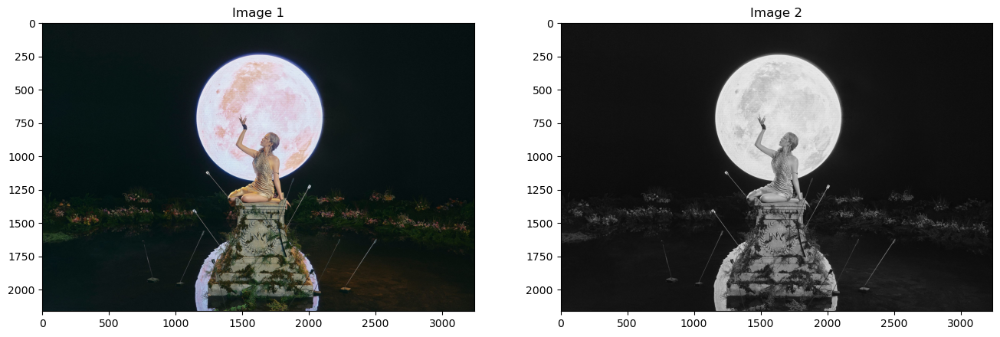

In [6]:
#Read image
image_color = imread("Taeyeon INVU P10.jpg")

#Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

#Display image
ShowTwoImages(image_color, image_gray)

### 4. Tạo ảnh HSV và hiển thị các kênh Hue, Saturation và Value

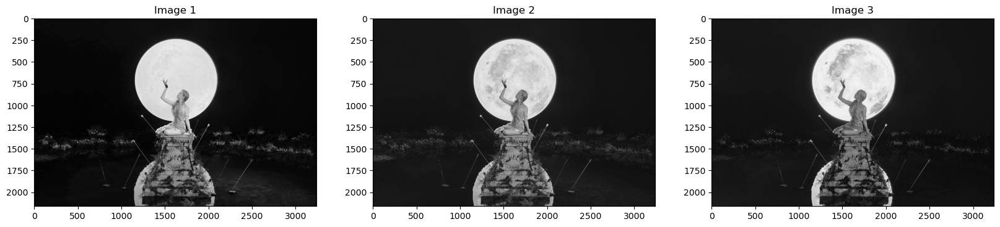

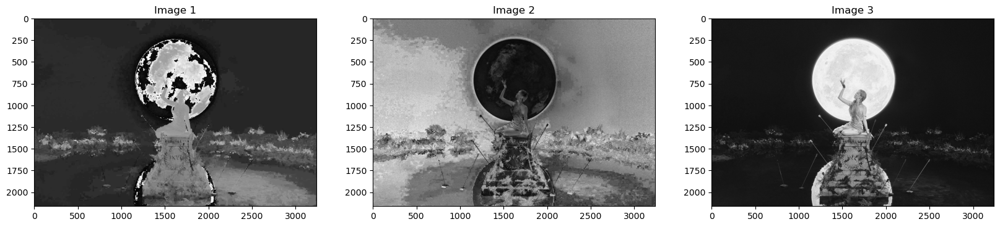

In [7]:
#Covert hình ảnh vào không gian màu HSV
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

#Hiển thị các kênh màu R, G, B
ShowThreeImages(image_color[:, :, 0], image_color[:, :, 1], image_color[:, :, 2])

#Hiển thị các kênh H, S, V
ShowThreeImages(image_hsv[:, :, 0], image_hsv[:, :, 1], image_hsv[:, :, 2])

### 5. Chọn ngưỡng hue để trích xuất đối tượng chủ đạo trong ảnh

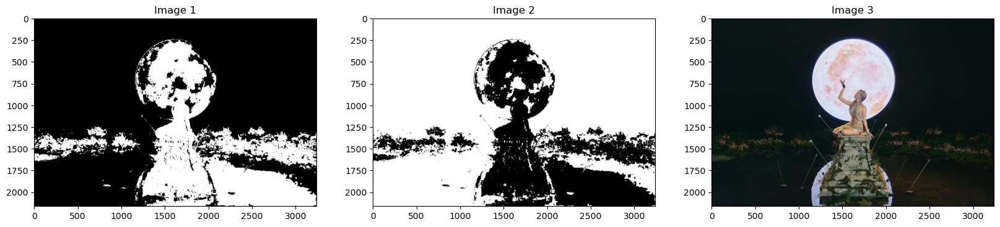

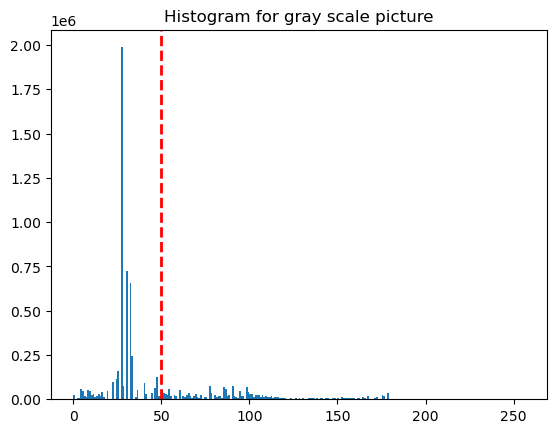

In [8]:
hue_img = image_hsv[:, :, 0]
hue_threshold = 50 #ngưỡng hue

#Dùng ngưỡng để trích xuất đối tượng
hue_binary01 = hue_img > hue_threshold
hue_binary02 = 1 - hue_binary01

#Hiển thị thêm ảnh màu đối tượng sau khi trích xuất
ShowThreeImages(hue_binary01, hue_binary02, image_color)

#Hiển thị histogram của kênh Hue
hist = cv2.calcHist([hue_img], [0], None, [256], [0,256])
plt.hist(hue_img.ravel(), 256, [0,256])
plt.axvline(x = hue_threshold, color = 'r', linestyle = 'dashed', linewidth = 2)
plt.title('Histogram for gray scale picture')
plt.show()

### 6. Hiển thị histogram của 3 kênh màu HSV và RGB

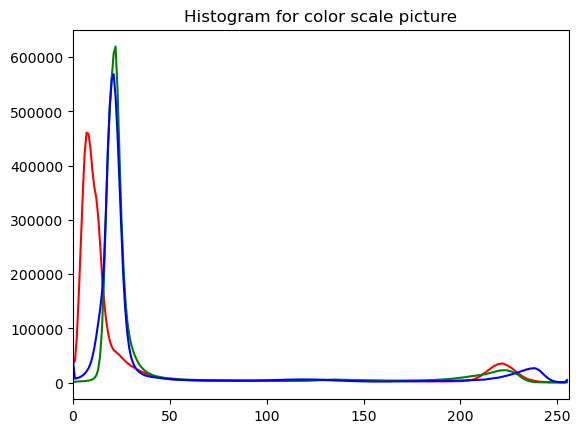

In [9]:
#Histogram của kênh màu RGB
color = ('r', 'g', 'b')
for channel, col in enumerate(color):
    #channel: lưu index, col: lưu 'r'/'g'/'b'
    histr = cv2.calcHist([image_color], [channel], None, [256],[0, 256])
    #[256]: bin, [0, 256]: khoảng giá trị
    plt.plot(histr, color = col)
    #vẽ đường biểu đồ theo màu tương ứng
    plt.xlim([0, 256])
    #trục hoành: 0 -> 256
plt.title('Histogram for color scale picture')
plt.show()

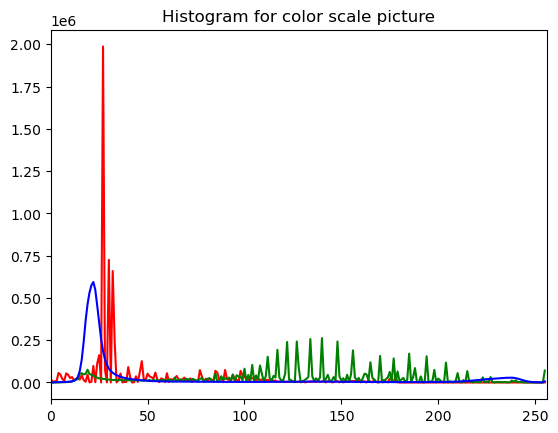

In [10]:
#Histogram của kênh màu HSV
color = ('r', 'g', 'b')
for channel, col in enumerate(color):
    histr = cv2.calcHist([image_hsv], [channel], None, [256], [0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title('Histogram for color scale picture')
plt.show()

### 7. Tách vật thể

In [11]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result
# sử dụng phép toán bitwise AND giữa hình ảnh IM và chính nó, 
# áp dụng mặt nạ Mask
# chỉ có các vùng ứng với các pixel có giá trị 255 trong Mask (các pixel muốn giữ lại) 
# sẽ được giữ lại trong result

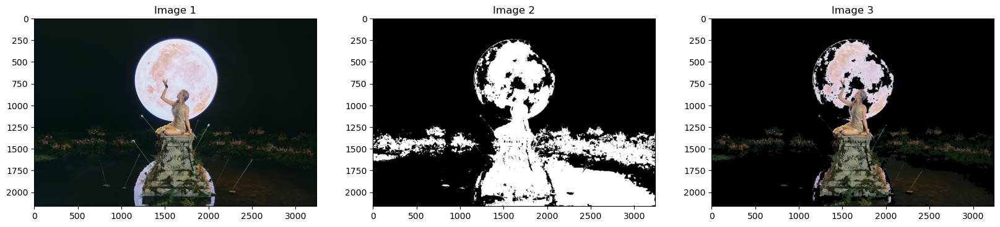

In [12]:
hue_binary01_rgb = SegmentColorImageByMask(image_color, hue_binary01)
ShowThreeImages(image_color, hue_binary01, hue_binary01_rgb)

# Bài 2

### 1. Tạo ảnh xám từ ảnh màu

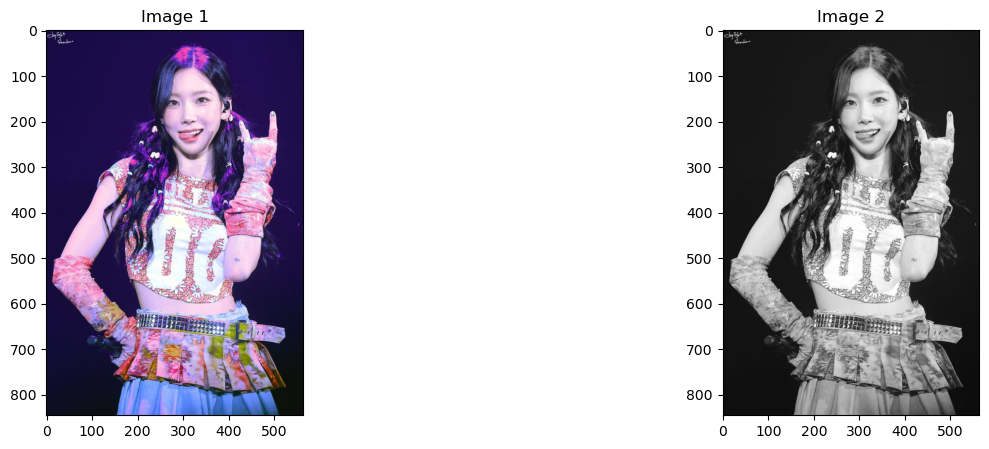

In [13]:
# Read Image
image_color = imread("TaeyeonNLA.jpg")

#Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

#Display Image
ShowTwoImages(image_color, image_gray)

### 2. Làm nhiễu ảnh

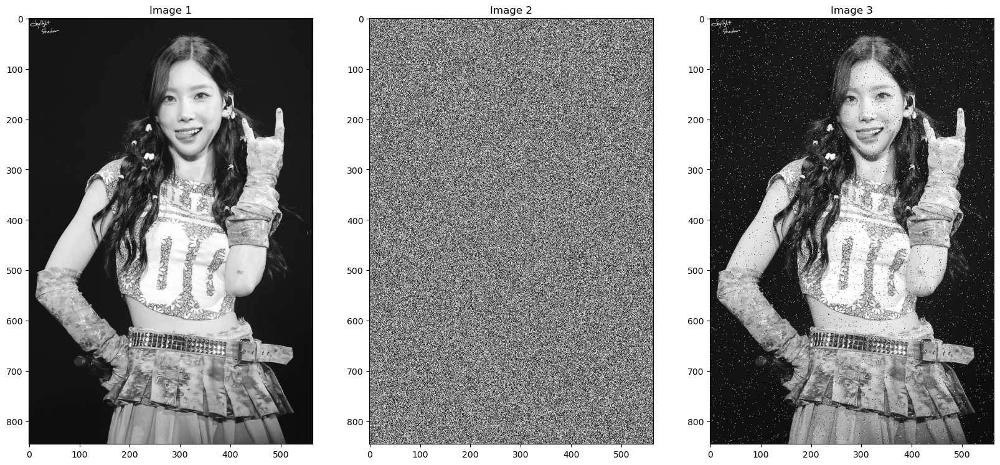

In [14]:
noise = np.random.random(image_gray.shape)
#tạo một mảng số thực ngẫu nhiên để đại diện cho nhiễu
image_noise = image_gray.copy()
image_noise[noise > 0.99] = 255
image_noise[noise < 0.01] = 0

ShowThreeImages(image_gray, noise, image_noise)

### 3. Làm mờ ảnh

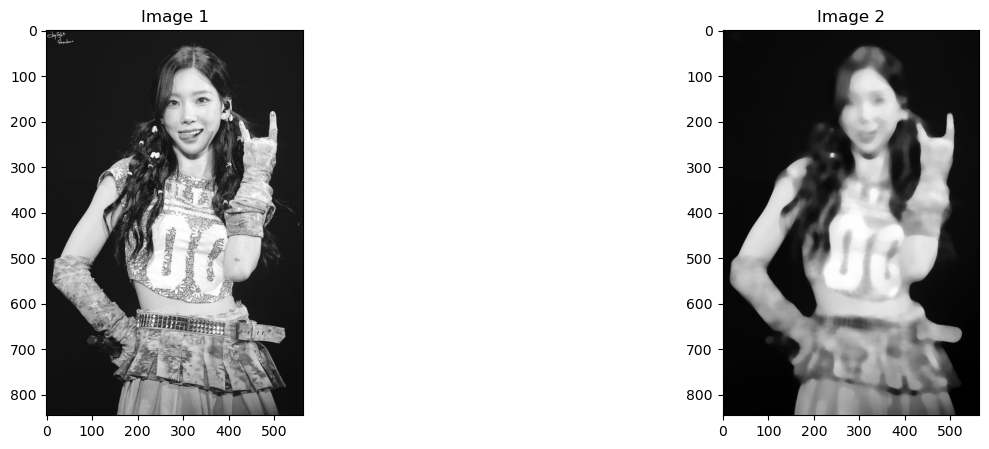

In [15]:
from skimage.filters.rank import median
from skimage.morphology import disk

image_blurred = median(image_gray, disk(10))
ShowTwoImages(image_gray, image_blurred)

### 4. Hiển thị histogram của ảnh xám và cân bằng histogram

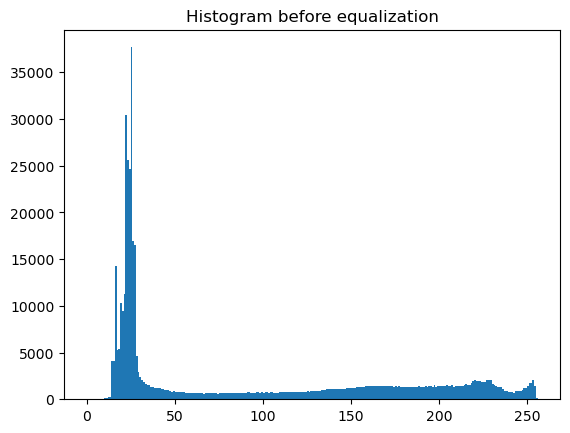

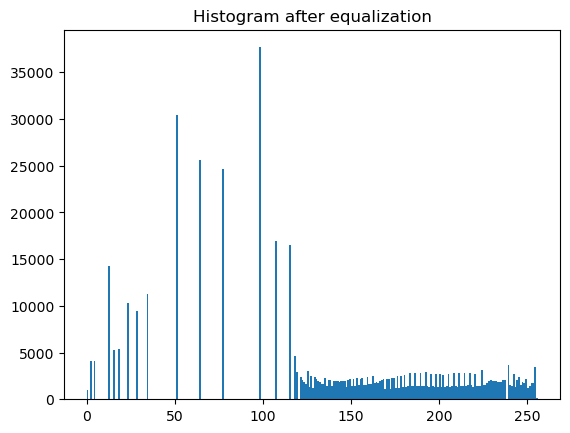

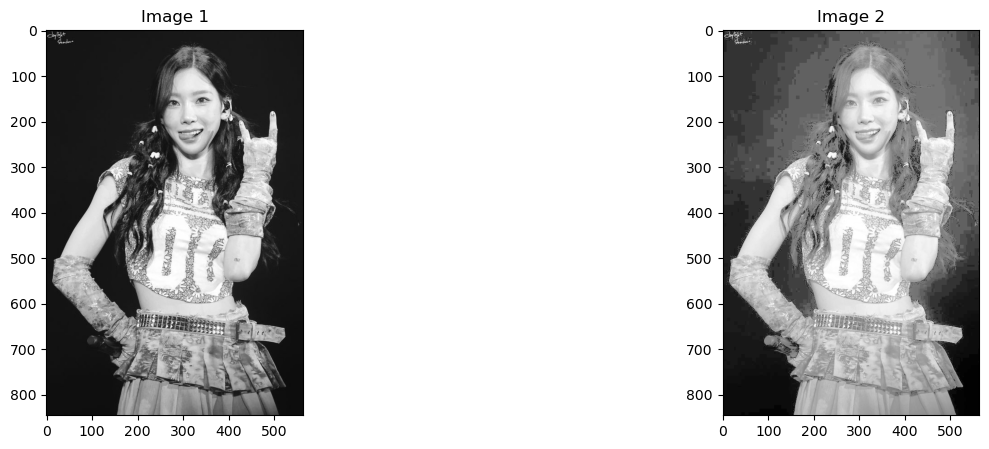

In [16]:
from skimage import data, exposure 
image_equalization = exposure.equalize_hist(image_gray)
image_equalization = np.float32(image_equalization * 255)

#Histogram của ảnh xám
hist = cv2.calcHist([image_gray],[0],None,[256],[0,256])
plt.hist(image_gray.ravel(),256,[0,256])
plt.title('Histogram before equalization')
plt.show()

# Histogram sau khi cân bằng
hist = cv2.calcHist([image_equalization],[0],None,[256],[0,256])
plt.hist(image_equalization.ravel(),256,[0,256])
plt.title('Histogram after equalization')
plt.show()

#Hiển thị ảnh sau khi cân bằng:
ShowTwoImages(image_gray, image_equalization)

### 5. Cân bằng 3 kênh màu RGB cùng lúc

In [17]:
def histogram_equalize(img):
    r, g, b = cv2.split(img) #tách kênh màu
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((red, green, blue))

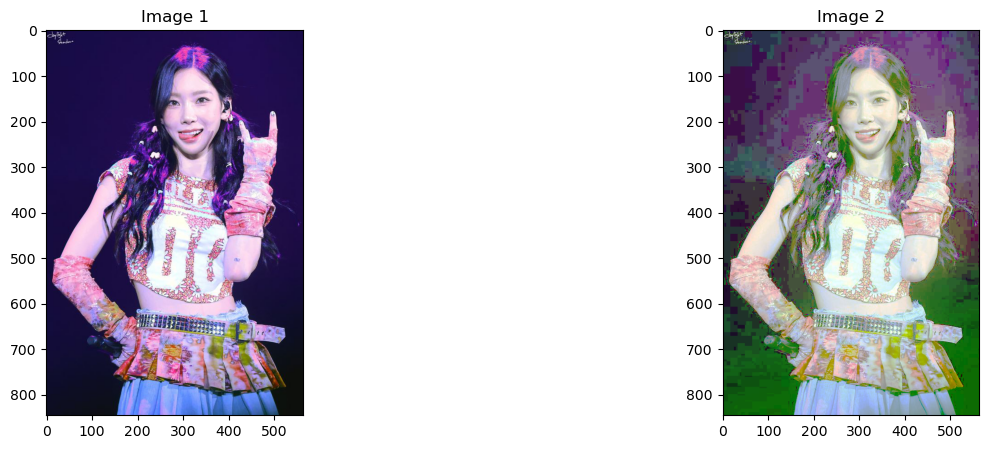

In [18]:
#Hiển thị kết quả sau khi cân bằng
image_equalization_color = histogram_equalize(image_color)
ShowTwoImages(image_color, image_equalization_color)

### 6. Cân bằng 3 kênh màu HSV cùng lúc

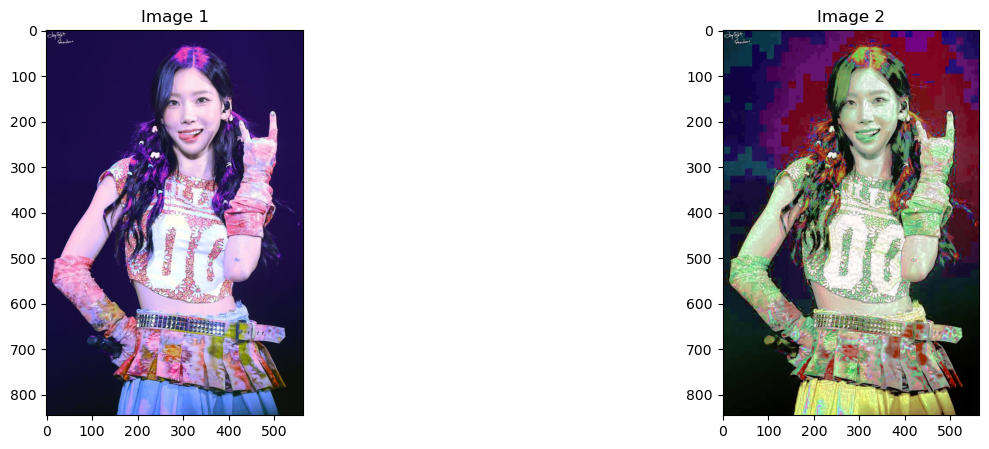

In [25]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)

# Apply histogram equalization
channel = 0
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
channel = 1
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
channel = 2
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])

# Hiển thị kết quả sau khi cân bằng
image_equalization_hsv = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image_color, image_equalization_hsv)

### 7. Enhance ảnh bằng cách cân bằng histogram kênh S và V

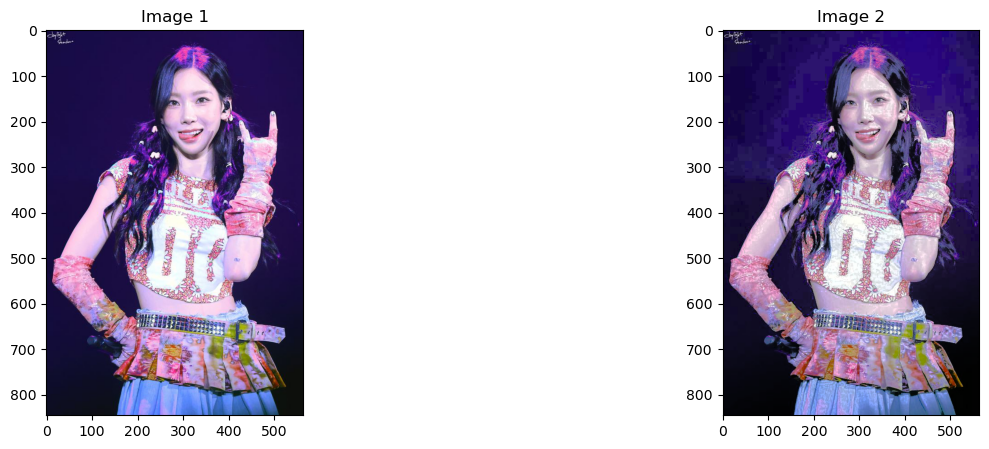

In [28]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)

# Apply histogram equalization
channel = 1
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
channel = 2
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])

# Convert to RGB
image_enhanced = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image_color, image_enhanced)

### 8. Biến đổi gamma

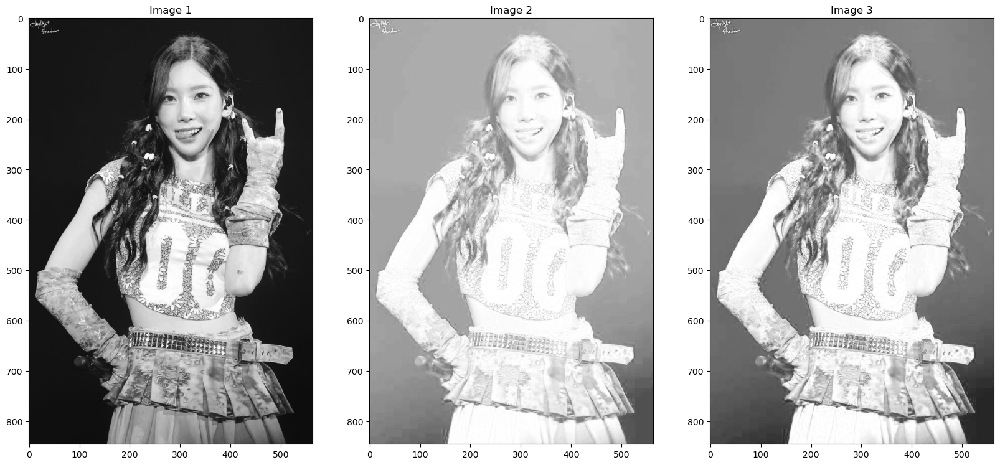

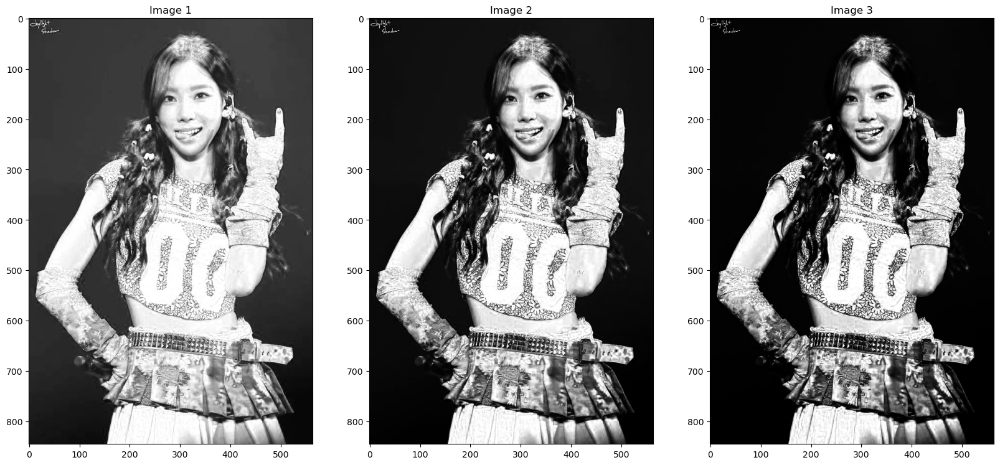

In [29]:
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
img = image_hsv[:,:,2]
gamma = [0.1, 0.5, 1.2, 2.2, 3.2]
gamma_corrected_01 = np.array(255*(img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255*(img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255*(img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255*(img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255*(img / 255) ** gamma[4], dtype = 'uint8')
ShowThreeImages(image_gray, gamma_corrected_01, gamma_corrected_02)
ShowThreeImages(gamma_corrected_03, gamma_corrected_04, gamma_corrected_05)

### 9. Chọn ngưỡng mức tối và ngưỡng mức sáng mà ở đó dưới mức tối sẽ cho tối hơn và trên mức sáng sẽ cho sáng hơn trên kênh màu Value trong HSV. Sau đó hiển thị ảnh kết quả sau khi Enhance 

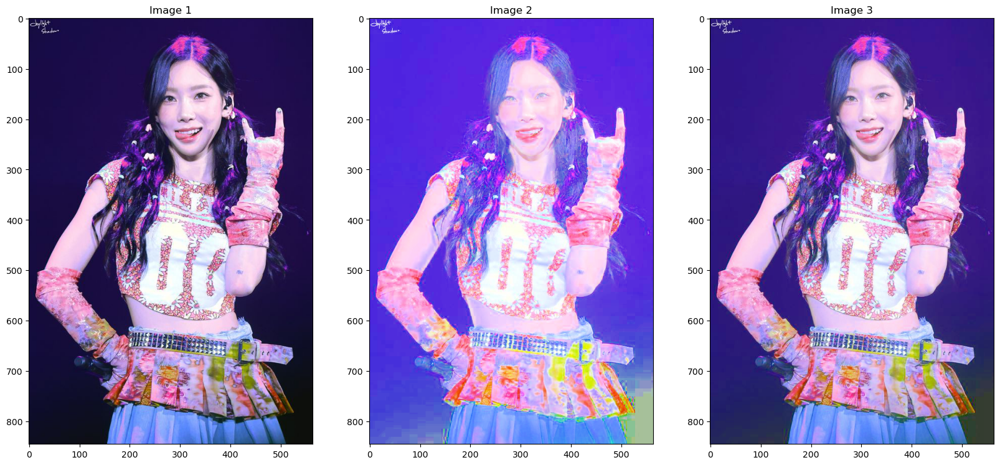

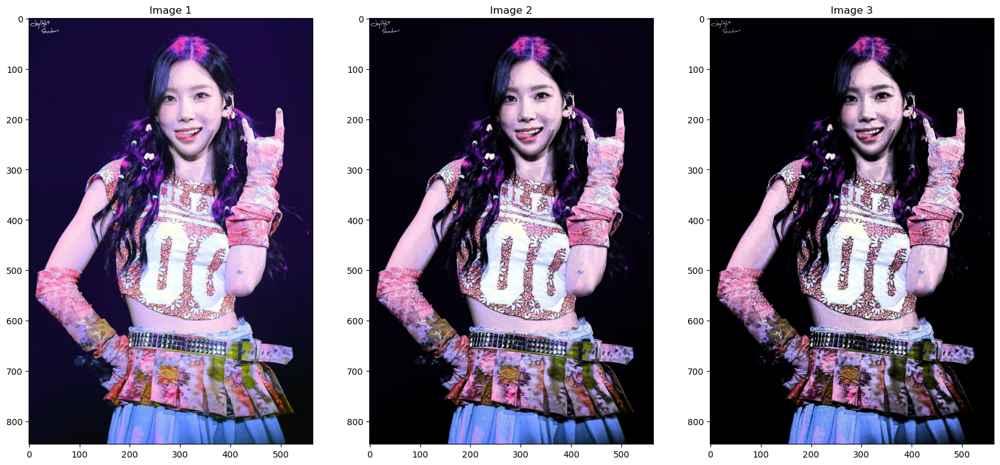

In [30]:
channel = 2
image_hsv_01 = image_hsv.copy()
image_hsv_01[:,:,2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image_hsv.copy()
image_hsv_02[:,:,2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image_hsv.copy()
image_hsv_03[:,:,2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image_hsv.copy()
image_hsv_04[:,:,2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image_hsv.copy()
image_hsv_05[:,:,2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

ShowThreeImages(image_color, image_enhanced_01, image_enhanced_02)
ShowThreeImages(image_enhanced_03, image_enhanced_04, image_enhanced_05)

### 10. Xuất biên/cạnh của ảnh gốc

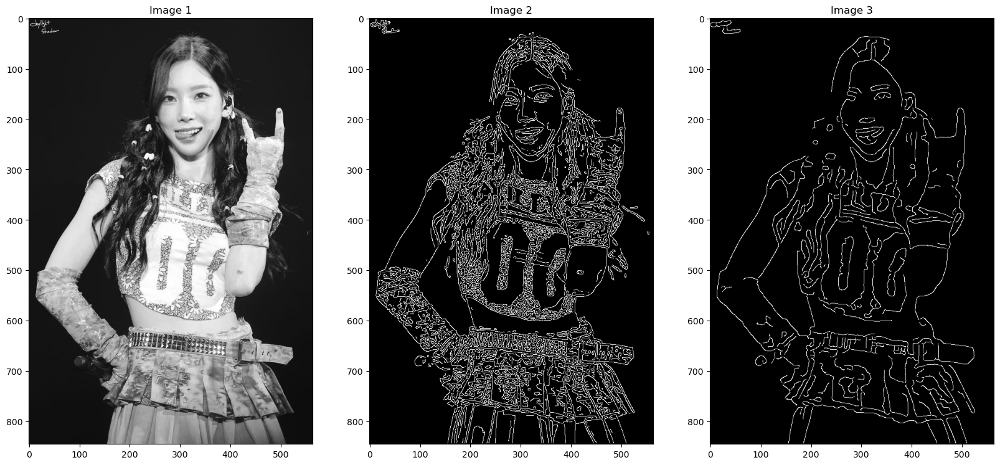

In [31]:
from skimage import feature
# sigma xóa nhiễu ở cạnh
image_edges_01 = feature.canny(image_gray)
image_edges_02 = feature.canny(image_gray, sigma=3)
ShowThreeImages(image_gray, image_edges_01, image_edges_02)